# Experiment Tracking
In this Notebook we will make many models with different hyperparameters.

THe notebook will cover the following.

1. Get data, Create Datasets and DataLoaders
2. Get customize pretrained model - Use Transfer Learning using 2 different models.
3. Train and track results.
4. View our models results in TensorBoard
5. Creating a helper function to track experiments
6. Setting up a series of modeling experiments.
7. Load the best model and make predictions.

In [1]:
# Connection to google drive.
from google.colab import drive
drive.mount('/content/drive')

import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torchvision
from torch import nn

# Move to the project directory
os.chdir("/content/drive/MyDrive/my_projects/animal_classification/")

# IMport the modules we have created previously
from going_modular import data_setup, engine,  utils#, prediction

Mounted at /content/drive


## 1. Get data and Create DataLoaders.
### 1.1 Setup your desire device


In [2]:
device = "cuda" if torch.cuda.is_available() else 'cpu'

### 1.2 Load the data
For the beginning we will use the `transformed_dataset_25_images` because it is a smaller dataset and we will have quicker results.


In [3]:
image_path = "/content/drive/MyDrive/my_projects/animal_classification/data_preprocessing_folder/transformed_dataset_100_images/"

train_data = image_path + 'train'
valid_data = image_path + 'valid'
test_data = image_path + 'test'


### 1.3 Create dataloader using prebuild function
At the beginning we will use the EfficientNet_B0, so we have to use the prebuilt transformers.

In [4]:
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT

# Transformers
auto_transformer = weights.transforms()

print(auto_transformer)

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)


In [5]:
# Create data loaders
train_dataloader, test_dataloader, valid_dataloader, class_names = data_setup.create_dataloader(
    train_data=train_data,
    test_data=test_data,
    valid_data = valid_data,
    transform = auto_transformer,
    batch_size = 32)


## 3. Train and track results
### 3.1 Get the weights of a pretrained model.



In [6]:
# SEtup the model with the pretrainded weights
model = torchvision.models.efficientnet_b0(weights=weights).to(device)

# Freeze the layers of the model
for param in model.parameters():
  param.requires_grad = False

# Update the classifier head to suit the problem
model.classifier = torch.nn.Sequential(
    nn.Dropout(p = 0.2, inplace = True),
    nn.Linear(in_features = 1280,
              out_features = len(class_names),
              bias = True)
).to(device)





Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 205MB/s]


In [7]:
# Return a summary of the model
try:
  from torchinfo import summary
except:
  print("[INFO] Couldn't find torchinfo... installing it.")
  !pip install -q torchinfo
  from torchinfo import summary

summary(model = model,
        input_size = (32, 3, 224, 224),
        col_names = ["input_size", "output_size", "num_params", "trainable"],
        col_width = 20,
        row_settings = ['var_names'])

[INFO] Couldn't find torchinfo... installing it.


Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 10]             --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

### 3.2 Train the model.

In [ ]:
# Create loss function and optimizer
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = model.parameters(), lr = 0.001)

# Train the model
results = engine.train(model = model,
             train_dataloader = train_dataloader,
             test_dataloader = valid_dataloader,
             loss_fn = loss_fn,
             optimizer = optimizer,
             epochs = 5,
             device = device)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6487 | train_acc: 0.6016 | test_loss: 1.0482 | test_acc: 0.8895
Epoch: 2 | train_loss: 0.8382 | train_acc: 0.8750 | test_loss: 0.6680 | test_acc: 0.9051
Epoch: 3 | train_loss: 0.5520 | train_acc: 0.9092 | test_loss: 0.5128 | test_acc: 0.9234
Epoch: 4 | train_loss: 0.4515 | train_acc: 0.9170 | test_loss: 0.4352 | test_acc: 0.9305
Epoch: 5 | train_loss: 0.3555 | train_acc: 0.9326 | test_loss: 0.3801 | test_acc: 0.9305


### 3.3 Use `SummaryWriter()` to track experiments
During the process of building models we track our experiments in Python Dictionaries. This is inpractical when we have to train many Deep learning algorithms.

We can use PyTorch's `torch.utils.tensorboard.SummaryWriter()` class to save varius parts of our models's training progress to file. The SummaryWriter class save information to the `log_dir`.


First we need to import or install the SummaryWriter()

In [8]:
try:
  from torch.utils.tensorboard import SummaryWriter
except:
  print("[INFO] Couldn't find torch.utils.tensorboard... installing it.")
  !pip install -q torch
  from torch.utils.tensorboard import SummaryWriter

# Create a writer with all default settings
writer = SummaryWriter('/content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs')

Now we must make some changes to the training loop.

Let's start bu `engine.train()`. Copy the function from going modular folder and `engine.py` file.



In [9]:
from typing import Dict, List, Tuple
import torch
from tqdm.auto import tqdm
from torch import nn
import os
from torch.utils.data import DataLoader


def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List[float]]:
  """Trains and tests a PyTorch model.

  Passes a target PyTorch models through train_step() and test_step()
  functions for a number of epochs, training and testing the model
  in the same epoch loop.

  Calculates, prints and stores evaluation metrics throughout.

  Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

  Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
                  train_acc: [...],
                  test_loss: [...],
                  test_acc: [...]}
    For example if training for epochs=2:
                 {train_loss: [2.0616, 1.0537],
                  train_acc: [0.3945, 0.3945],
                  test_loss: [1.2641, 1.5706],
                  test_acc: [0.3400, 0.2973]}
  """
  # Create empty results dictionary
  results = {"train_loss": [],
      "train_acc": [],
      "test_loss": [],
      "test_acc": []
  }

  # Loop through training and testing steps for a number of epochs
  for epoch in tqdm(range(epochs)):
      train_loss, train_acc = engine.train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
      test_loss, test_acc = engine.test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

      # Print out what's happening
      print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
      )

      # Update results dictionary
      results["train_loss"].append(train_loss)
      results["train_acc"].append(train_acc)
      results["test_loss"].append(test_loss)
      results["test_acc"].append(test_acc)

      ### NEW: Experiment tracking ###
      # Add loss results to SummaryWriter
      writer.add_scalars(main_tag = 'loss',
                         tag_scalar_dict = {'train_loss': train_loss,
                                            "test_loss": test_loss},
                         global_step = epoch)

      # Add accuracy results to SummaryWriter
      writer.add_scalars(main_tag="Accuracy",
                          tag_scalar_dict={"train_acc": train_acc,
                                          "test_acc": test_acc},
                          global_step=epoch)

      # Track the PyTorch model architecture
      writer.add_graph(model=model,
                        # Pass in an example input
                        input_to_model=torch.randn(32, 3, 224, 224).to(device))

      # Close the writer()
      writer.close()

      ### END NEW ###
  # Return the filled results at the end of the epochs
  return results

In [10]:
'''results = train(model=model,
                train_dataloader=train_dataloader,
                test_dataloader=valid_dataloader,
                optimizer=optimizer,
                loss_fn=loss_fn,
                epochs=5,
                device=device)'''

'results = train(model=model,\n                train_dataloader=train_dataloader,\n                test_dataloader=valid_dataloader,\n                optimizer=optimizer,\n                loss_fn=loss_fn,\n                epochs=5,\n                device=device)'

## 4. View our model's results to TensorBoard


In [11]:
'''%reload_ext tensorboard
%tensorboard --logdir runs'''

'%reload_ext tensorboard\n%tensorboard --logdir runs'

## 5. Create a helper function to track experiments.
In this section we will create a function that builds `SummaryWriter()` instances and help us to track the progress we have when we creating a model.

For exaple. we want to track our models like:
- **Experiment date** - when did the experiment take place?
- **Experiment name ** - is there something we'd like to call the experiment?
- **Model name** - what model was used?
- ** Extra** - should anything else be tracked ?



In [12]:
def create_writer(experiment_name: str,
                  model_name : str,
                  extra: str = None):
  """
    Create a torch.utils.tensorboard.writer.SummaryWriter() instance saving to a specific log_dir.

    log_dir is a combination of runs/timestamp/experiment_name/model_name/extra.

    Where timestamp is the currend date in YYYY-MM-DD format

    Args:
      - experiment_name (str): Name of the experiment.
      - model_name (str): Name of the model.
      - extra (str, optional): Anything extra you'd like to include in the folder name.

    Returns:
      - torch.utils.tensorboard.writer.SummaryWriter(): Instance of a writer saving to log_dir.

  """

  from datetime import datetime
  import os

  # Get the timestamp of current data
  timestamp = datetime.now().strftime('%Y-%m-%d')

  if extra:
    # Create log dir path
    log_dir = os.path.join("/content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs", timestamp, experiment_name, model_name, extra)
  else:
    log_dir = os.path.join("/content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs", timestamp, experiment_name, model_name)

  print(f"[INFO] Created SummaryWriter, saving to: {log_dir}...")
  return SummaryWriter(log_dir = log_dir)

In [13]:
example_writer = create_writer(experiment_name = "data_10_percent",
                               model_name = 'effnetb0',
                               extra = '5_epochs')


[INFO] Created SummaryWriter, saving to: /content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs/2024-12-14/data_10_percent/effnetb0/5_epochs...


### 5.1 Update the train function to use the create_writer()

In [14]:
from typing import Dict, List
from tqdm.auto import tqdm

# Add writer parameter to train()
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer: torch.utils.tensorboard.writer.SummaryWriter # new parameter to take in a writer
          ) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Stores metrics to specified writer log_dir if present.

    Args:
      model: A PyTorch model to be trained and tested.
      train_dataloader: A DataLoader instance for the model to be trained on.
      test_dataloader: A DataLoader instance for the model to be tested on.
      optimizer: A PyTorch optimizer to help minimize the loss function.
      loss_fn: A PyTorch loss function to calculate loss on both datasets.
      epochs: An integer indicating how many epochs to train for.
      device: A target device to compute on (e.g. "cuda" or "cpu").
      writer: A SummaryWriter() instance to log model results to.

    Returns:
      A dictionary of training and testing loss as well as training and
      testing accuracy metrics. Each metric has a value in a list for
      each epoch.
      In the form: {train_loss: [...],
                train_acc: [...],
                test_loss: [...],
                test_acc: [...]}
      For example if training for epochs=2:
              {train_loss: [2.0616, 1.0537],
                train_acc: [0.3945, 0.3945],
                test_loss: [1.2641, 1.5706],
                test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = engine.train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = engine.test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)


        ### New: Use the writer parameter to track experiments ###
        # See if there's a writer, if so, log to it
        if writer:
            # Add results to SummaryWriter
            writer.add_scalars(main_tag="Loss",
                               tag_scalar_dict={"train_loss": train_loss,
                                                "test_loss": test_loss},
                               global_step=epoch)
            writer.add_scalars(main_tag="Accuracy",
                               tag_scalar_dict={"train_acc": train_acc,
                                                "test_acc": test_acc},
                               global_step=epoch)

            # Close the writer
            writer.close()
        else:
            pass
    ### End new ###

    # Return the filled results at the end of the epochs
    return results

In [15]:
train(model=model,
                  train_dataloader=train_dataloader,
                  test_dataloader=test_dataloader,
                  optimizer=optimizer,
                  loss_fn=loss_fn,
                  epochs=5,
                  device=device,
                  writer=create_writer(experiment_name='50_images',
                                       model_name='effnetb0',
                                       extra=f"{5}_epochs"))

NameError: name 'optimizer' is not defined

## 6. Setting up a series of modeling experience.

After modifying the `train()` function, in a way that enable us to save our experiments, we move forward to apply a series of experiments.

### 6.1 What kind of experiment we should run?

There are countless experiments than we can run. We can change every hyperparameter of the model and then train it.

We will try the following compination:
1. A different amount of data (25, 50, 100 images of every class)
2. A different model (EfficientNetB0 vs EfficientNetbB2)
3. A different training time. (5 vs 10 epochs)


### 6.2 Set up the three different datasets
In this sections will do the following:
1. Setup up the path to every one of the datasets.
2. Create DataLoaders

In [16]:
# Create the paths of the datasets
path_25_images = '/content/drive/MyDrive/my_projects/animal_classification/data_preprocessing_folder/transformed_dataset_25_images'
path_50_images = '/content/drive/MyDrive/my_projects/animal_classification/data_preprocessing_folder/transformed_dataset_50_images'
path_100_images = '/content/drive/MyDrive/my_projects/animal_classification/data_preprocessing_folder/transformed_dataset_100_images'

# Create the train path
train_path_25_images = path_25_images + '/train'
train_path_50_images = path_50_images + '/train'
train_path_100_images = path_100_images + '/train'

# the testing and validation sets are the same. so we will do it once
valid_path = path_25_images + '/valid'
test_path = path_25_images + '/test'


In [17]:
# Create the data transformations
from torchvision import transforms

normalize = transforms.Normalize(mean = [0.485, 0.456, 0.406],
                                 std = [0.229, 0.224, 0.225])

data_transformations = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    normalize])

In [18]:
# Create Dataloader
train_dataloader_25_images , test_dataloader,valid_dataloader, class_names = data_setup.create_dataloader(
          train_data = train_path_25_images,
          test_data = test_path,
          valid_data = valid_path,
          batch_size = 32,
          transform = data_transformations
)

train_dataloader_50_images , test_dataloader,valid_dataloader, class_names = data_setup.create_dataloader(
          train_data = train_path_50_images,
          test_data = test_path,
          valid_data = valid_path,
          batch_size = 32,
          transform = data_transformations
)

train_dataloader_100_images , test_dataloader,valid_dataloader, class_names = data_setup.create_dataloader(
          train_data = train_path_100_images,
          test_data = test_path,
          valid_data = valid_path,
          batch_size = 32,
          transform = data_transformations
)

### 6.3 Create feature extractor models.

In [19]:
import torchvision
from torch import nn

# Get num out features (one for each class pizza, steak, sushi)
OUT_FEATURES = len(class_names)

# Create an EffNetB0 feature extractor
def create_effnetb0():
    # 1. Get the base model with pretrained weights and send to target device
    weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
    model = torchvision.models.efficientnet_b0(weights=weights).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features=1280, out_features=OUT_FEATURES)
    ).to(device)

    # 4. Give the model a name
    model.name = "effnetb0"
    print(f"[INFO] Created new {model.name} model.")
    return model

# Create an EffNetB2 feature extractor
def create_effnetb2():
    # 1. Get the base model with pretrained weights and send to target device
    weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
    model = torchvision.models.efficientnet_b2(weights=weights).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.3),
        nn.Linear(in_features=1408, out_features=OUT_FEATURES)
    ).to(device)

    # 4. Give the model a name
    model.name = "effnetb2"
    print(f"[INFO] Created new {model.name} model.")
    return model

### 6.4 Create experiments and set up training code.

In [20]:
# Create a list of epochs
num_epochs = [ 5, 10]

# create models list
models = ['effnetb0', 'effnetb2']

# Create a list of datasets
datasets = {
    '25_images': train_dataloader_25_images,
    '50_images': train_dataloader_50_images,
    '100_images': train_dataloader_100_images
}

In [ ]:
%%time
from going_modular.utils import save_model

# 1. Set the random seeds

# 2. Keep track of experiment numbers
experiment_number = 0

# 3. Loop through each DataLoader
for dataloader_name, train_dataloader in datasets.items():

    # 4. Loop through each number of epochs
    for epochs in num_epochs:

        # 5. Loop through each model name and create a new model based on the name
        for model_name in models:

            # 6. Create information print outs
            experiment_number += 1
            print(f"[INFO] Experiment number: {experiment_number}")
            print(f"[INFO] Model: {model_name}")
            print(f"[INFO] DataLoader: {dataloader_name}")
            print(f"[INFO] Number of epochs: {epochs}")

            # 7. Select the model
            if model_name == "effnetb0":
                model = create_effnetb0() # creates a new model each time (important because we want each experiment to start from scratch)
            else:
                model = create_effnetb2() # creates a new model each time (important because we want each experiment to start from scratch)

            # 8. Create a new loss and optimizer for every model
            loss_fn = nn.CrossEntropyLoss()
            optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)

            # 9. Train target model with target dataloaders and track experiments
            train(model=model,
                  train_dataloader=train_dataloader,
                  test_dataloader=test_dataloader,
                  optimizer=optimizer,
                  loss_fn=loss_fn,
                  epochs=epochs,
                  device=device,
                  writer=create_writer(experiment_name=dataloader_name,
                                       model_name=model_name,
                                       extra=f"{epochs}_epochs"))

            # 10. Save the model to file so we can get back the best model
            save_filepath = f"07_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
            save_model(model=model,
                       target_dir="models",
                       model_name=save_filepath)
            print("-"*50 + "\n")

[INFO] Experiment number: 1
[INFO] Model: effnetb0
[INFO] DataLoader: 25_images
[INFO] Number of epochs: 5
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: /content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs/2024-12-13/25_images/effnetb0/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1673 | train_acc: 0.3107 | test_loss: 1.9153 | test_acc: 0.7117
Epoch: 2 | train_loss: 1.7213 | train_acc: 0.7212 | test_loss: 1.6021 | test_acc: 0.7988
Epoch: 3 | train_loss: 1.3441 | train_acc: 0.8567 | test_loss: 1.3630 | test_acc: 0.8320
Epoch: 4 | train_loss: 1.0870 | train_acc: 0.8957 | test_loss: 1.1839 | test_acc: 0.8438
Epoch: 5 | train_loss: 0.8704 | train_acc: 0.9240 | test_loss: 1.0461 | test_acc: 0.8555
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model: effnetb2
[INFO] DataLoader: 25_images
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: /content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs/2024-12-13/25_images/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1943 | train_acc: 0.2933 | test_loss: 1.9107 | test_acc: 0.7309
Epoch: 2 | train_loss: 1.6861 | train_acc: 0.7464 | test_loss: 1.5547 | test_acc: 0.8484
Epoch: 3 | train_loss: 1.2986 | train_acc: 0.8810 | test_loss: 1.2913 | test_acc: 0.8719
Epoch: 4 | train_loss: 1.0203 | train_acc: 0.9318 | test_loss: 1.1021 | test_acc: 0.8895
Epoch: 5 | train_loss: 0.8596 | train_acc: 0.9414 | test_loss: 0.9652 | test_acc: 0.8914
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model: effnetb0
[INFO] DataLoader: 25_images
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: /content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs/2024-12-13/25_images/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1670 | train_acc: 0.2737 | test_loss: 1.8841 | test_acc: 0.6785
Epoch: 2 | train_loss: 1.7171 | train_acc: 0.6920 | test_loss: 1.5761 | test_acc: 0.8094
Epoch: 3 | train_loss: 1.3418 | train_acc: 0.8675 | test_loss: 1.3299 | test_acc: 0.8426
Epoch: 4 | train_loss: 1.0876 | train_acc: 0.8900 | test_loss: 1.1458 | test_acc: 0.8641
Epoch: 5 | train_loss: 0.8808 | train_acc: 0.9444 | test_loss: 1.0116 | test_acc: 0.8699
Epoch: 6 | train_loss: 0.7287 | train_acc: 0.9444 | test_loss: 0.9127 | test_acc: 0.8758
Epoch: 7 | train_loss: 0.6174 | train_acc: 0.9474 | test_loss: 0.8380 | test_acc: 0.8777
Epoch: 8 | train_loss: 0.5407 | train_acc: 0.9688 | test_loss: 0.7788 | test_acc: 0.8809
Epoch: 9 | train_loss: 0.4804 | train_acc: 0.9648 | test_loss: 0.7239 | test_acc: 0.8848
Epoch: 10 | train_loss: 0.4243 | train_acc: 0.9766 | test_loss: 0.6859 | test_acc: 0.8906
--------------------------------------------------

[INFO] Experiment number: 4
[INFO] Model: effnetb2
[INFO]

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1509 | train_acc: 0.2900 | test_loss: 1.9345 | test_acc: 0.7449
Epoch: 2 | train_loss: 1.6873 | train_acc: 0.7593 | test_loss: 1.5744 | test_acc: 0.8418
Epoch: 3 | train_loss: 1.2985 | train_acc: 0.8801 | test_loss: 1.3032 | test_acc: 0.8770
Epoch: 4 | train_loss: 1.0476 | train_acc: 0.9270 | test_loss: 1.1110 | test_acc: 0.8867
Epoch: 5 | train_loss: 0.7830 | train_acc: 0.9591 | test_loss: 0.9713 | test_acc: 0.8887
Epoch: 6 | train_loss: 0.6462 | train_acc: 0.9639 | test_loss: 0.8659 | test_acc: 0.8906
Epoch: 7 | train_loss: 0.5475 | train_acc: 0.9660 | test_loss: 0.7910 | test_acc: 0.8906
Epoch: 8 | train_loss: 0.4799 | train_acc: 0.9805 | test_loss: 0.7369 | test_acc: 0.8965
Epoch: 9 | train_loss: 0.4130 | train_acc: 0.9796 | test_loss: 0.6924 | test_acc: 0.8965
Epoch: 10 | train_loss: 0.3519 | train_acc: 0.9757 | test_loss: 0.6553 | test_acc: 0.8945
--------------------------------------------------

[INFO] Experiment number: 5
[INFO] Model: effnetb0
[INFO]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0085 | train_acc: 0.3984 | test_loss: 1.5841 | test_acc: 0.8063
Epoch: 2 | train_loss: 1.3185 | train_acc: 0.8406 | test_loss: 1.1542 | test_acc: 0.8543
Epoch: 3 | train_loss: 0.9503 | train_acc: 0.8695 | test_loss: 0.9142 | test_acc: 0.8680
Epoch: 4 | train_loss: 0.6979 | train_acc: 0.9051 | test_loss: 0.7576 | test_acc: 0.8855
Epoch: 5 | train_loss: 0.5942 | train_acc: 0.9172 | test_loss: 0.6619 | test_acc: 0.8973
--------------------------------------------------

[INFO] Experiment number: 6
[INFO] Model: effnetb2
[INFO] DataLoader: 50_images
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: /content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs/2024-12-13/50_images/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9902 | train_acc: 0.4133 | test_loss: 1.5672 | test_acc: 0.8633
Epoch: 2 | train_loss: 1.2583 | train_acc: 0.8832 | test_loss: 1.1095 | test_acc: 0.9043
Epoch: 3 | train_loss: 0.8506 | train_acc: 0.9145 | test_loss: 0.8554 | test_acc: 0.9043
Epoch: 4 | train_loss: 0.6155 | train_acc: 0.9344 | test_loss: 0.7118 | test_acc: 0.9043
Epoch: 5 | train_loss: 0.4821 | train_acc: 0.9508 | test_loss: 0.6157 | test_acc: 0.9160
--------------------------------------------------

[INFO] Experiment number: 7
[INFO] Model: effnetb0
[INFO] DataLoader: 50_images
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: /content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs/2024-12-13/50_images/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9741 | train_acc: 0.4191 | test_loss: 1.5681 | test_acc: 0.8133
Epoch: 2 | train_loss: 1.2951 | train_acc: 0.8426 | test_loss: 1.1431 | test_acc: 0.8680
Epoch: 3 | train_loss: 0.9380 | train_acc: 0.8867 | test_loss: 0.8972 | test_acc: 0.8836
Epoch: 4 | train_loss: 0.7219 | train_acc: 0.8871 | test_loss: 0.7492 | test_acc: 0.8992
Epoch: 5 | train_loss: 0.5836 | train_acc: 0.9160 | test_loss: 0.6613 | test_acc: 0.9012
Epoch: 6 | train_loss: 0.4782 | train_acc: 0.9391 | test_loss: 0.5977 | test_acc: 0.8992
Epoch: 7 | train_loss: 0.4008 | train_acc: 0.9395 | test_loss: 0.5489 | test_acc: 0.9070
Epoch: 8 | train_loss: 0.3813 | train_acc: 0.9422 | test_loss: 0.5188 | test_acc: 0.9148
Epoch: 9 | train_loss: 0.3411 | train_acc: 0.9500 | test_loss: 0.4841 | test_acc: 0.9109
Epoch: 10 | train_loss: 0.2838 | train_acc: 0.9746 | test_loss: 0.4655 | test_acc: 0.9031
--------------------------------------------------

[INFO] Experiment number: 8
[INFO] Model: effnetb2
[INFO]

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9312 | train_acc: 0.5305 | test_loss: 1.4945 | test_acc: 0.8496
Epoch: 2 | train_loss: 1.2424 | train_acc: 0.8496 | test_loss: 1.0676 | test_acc: 0.8984
Epoch: 3 | train_loss: 0.8327 | train_acc: 0.8895 | test_loss: 0.8389 | test_acc: 0.8965
Epoch: 4 | train_loss: 0.6209 | train_acc: 0.9324 | test_loss: 0.6948 | test_acc: 0.9102
Epoch: 5 | train_loss: 0.4889 | train_acc: 0.9402 | test_loss: 0.6104 | test_acc: 0.9102
Epoch: 6 | train_loss: 0.4415 | train_acc: 0.9301 | test_loss: 0.5680 | test_acc: 0.9082
Epoch: 7 | train_loss: 0.3858 | train_acc: 0.9551 | test_loss: 0.5177 | test_acc: 0.9102
Epoch: 8 | train_loss: 0.3186 | train_acc: 0.9664 | test_loss: 0.4911 | test_acc: 0.9082
Epoch: 9 | train_loss: 0.2972 | train_acc: 0.9625 | test_loss: 0.4717 | test_acc: 0.9062
Epoch: 10 | train_loss: 0.2752 | train_acc: 0.9656 | test_loss: 0.4496 | test_acc: 0.9102
--------------------------------------------------

[INFO] Experiment number: 9
[INFO] Model: effnetb0
[INFO]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.7167 | train_acc: 0.5889 | test_loss: 1.1496 | test_acc: 0.8660
Epoch: 2 | train_loss: 0.8773 | train_acc: 0.8945 | test_loss: 0.7378 | test_acc: 0.8855
Epoch: 3 | train_loss: 0.5965 | train_acc: 0.9170 | test_loss: 0.5715 | test_acc: 0.9090
Epoch: 4 | train_loss: 0.4528 | train_acc: 0.9395 | test_loss: 0.4894 | test_acc: 0.9070
Epoch: 5 | train_loss: 0.3816 | train_acc: 0.9463 | test_loss: 0.4313 | test_acc: 0.9187
--------------------------------------------------

[INFO] Experiment number: 10
[INFO] Model: effnetb2
[INFO] DataLoader: 100_images
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: /content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs/2024-12-13/100_images/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6523 | train_acc: 0.6201 | test_loss: 1.0931 | test_acc: 0.8887
Epoch: 2 | train_loss: 0.8211 | train_acc: 0.8975 | test_loss: 0.6942 | test_acc: 0.9004
Epoch: 3 | train_loss: 0.5422 | train_acc: 0.9287 | test_loss: 0.5484 | test_acc: 0.9160
Epoch: 4 | train_loss: 0.4166 | train_acc: 0.9414 | test_loss: 0.4719 | test_acc: 0.9102
Epoch: 5 | train_loss: 0.3439 | train_acc: 0.9443 | test_loss: 0.4087 | test_acc: 0.9160
--------------------------------------------------

[INFO] Experiment number: 11
[INFO] Model: effnetb0
[INFO] DataLoader: 100_images
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: /content/drive/MyDrive/my_projects/animal_classification/experiment_tracking_folder/runs/2024-12-13/100_images/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6776 | train_acc: 0.5869 | test_loss: 1.1060 | test_acc: 0.8660
Epoch: 2 | train_loss: 0.8497 | train_acc: 0.8828 | test_loss: 0.7234 | test_acc: 0.8895
Epoch: 3 | train_loss: 0.5562 | train_acc: 0.9092 | test_loss: 0.5546 | test_acc: 0.8992
Epoch: 4 | train_loss: 0.4445 | train_acc: 0.9326 | test_loss: 0.4859 | test_acc: 0.8973
Epoch: 5 | train_loss: 0.3775 | train_acc: 0.9346 | test_loss: 0.4366 | test_acc: 0.9062
Epoch: 6 | train_loss: 0.3201 | train_acc: 0.9453 | test_loss: 0.3861 | test_acc: 0.9207
Epoch: 7 | train_loss: 0.3051 | train_acc: 0.9395 | test_loss: 0.3681 | test_acc: 0.9199
Epoch: 8 | train_loss: 0.2420 | train_acc: 0.9541 | test_loss: 0.3394 | test_acc: 0.9227
Epoch: 9 | train_loss: 0.2229 | train_acc: 0.9678 | test_loss: 0.3266 | test_acc: 0.9199
Epoch: 10 | train_loss: 0.1994 | train_acc: 0.9658 | test_loss: 0.3114 | test_acc: 0.9285
--------------------------------------------------

[INFO] Experiment number: 12
[INFO] Model: effnetb2
[INFO

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6552 | train_acc: 0.6309 | test_loss: 1.0947 | test_acc: 0.8914
Epoch: 2 | train_loss: 0.8067 | train_acc: 0.8877 | test_loss: 0.6833 | test_acc: 0.9070
Epoch: 3 | train_loss: 0.5251 | train_acc: 0.9326 | test_loss: 0.5305 | test_acc: 0.9051
Epoch: 4 | train_loss: 0.4121 | train_acc: 0.9336 | test_loss: 0.4449 | test_acc: 0.9129
Epoch: 5 | train_loss: 0.3318 | train_acc: 0.9561 | test_loss: 0.4269 | test_acc: 0.9090
Epoch: 6 | train_loss: 0.3071 | train_acc: 0.9521 | test_loss: 0.3812 | test_acc: 0.9160
Epoch: 7 | train_loss: 0.2662 | train_acc: 0.9551 | test_loss: 0.3428 | test_acc: 0.9207
Epoch: 8 | train_loss: 0.2450 | train_acc: 0.9551 | test_loss: 0.3341 | test_acc: 0.9160
Epoch: 9 | train_loss: 0.1970 | train_acc: 0.9756 | test_loss: 0.3242 | test_acc: 0.9129
Epoch: 10 | train_loss: 0.2011 | train_acc: 0.9697 | test_loss: 0.3135 | test_acc: 0.9207
--------------------------------------------------

CPU times: user 2min 15s, sys: 34.9 s, total: 2min 50s
Wa

In [19]:
os.chdir("/content/drive/MyDrive/my_projects/animal_classification/")

%load_ext tensorboard
%tensorboard --logdir experiment_tracking_folder/runs

Output hidden; open in https://colab.research.google.com to view.

## 7. Load in the best model and make predictions with it
From the TensorBoard logs for our twelve experiments, it seems that the models are very close to each other.

We will continue by using the model with the following hyperparameters:
1. Use the dataset that contains the dataset with 100 images per class.
2. 10 epochs.
3. EffNetB2 model.

It seems that the biggest model, we have created achieved the best results. From now, we will make the following steps:
1. Load the best model so far.
2. Check the size of the model
3. Evaluate the model:
  * Check the accuracy of the model in unseen data.
  * Use different metrics such confusion matrix.
  * Predict on a custom image.
  

### 7.1 Load the model

In [21]:
best_model_path = '/content/drive/MyDrive/my_projects/animal_classification/models/07_effnetb2_100_images_10_epochs.pth'

# Instantiate a new instance of EffNetB2
best_model = create_effnetb2()

# Load and save the best model state_dict()
best_model.load_state_dict(torch.load(best_model_path, map_location=torch.device('cpu')))
print("Best model loaded successfully on CPU.")


Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 139MB/s]
<ipython-input-21-63d16ef93013>:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don

[INFO] Created new effnetb2 model.
Best model loaded successfully on CPU.


### 7.2 Check the size of the model

The step of checking the size of the model is very important. The final goal of every machine learning model is deployment.

If the model we have create is too large, maybe is not good for our case.


In [22]:
# Chaekc the model file size

from pathlib import Path

# Get the model size in bytes the conver to megabytes
effnetb2_model_size = Path(best_model_path).stat().st_size / 1024**2
print(f"EfficientNetB2 feature extractor model size: {round(effnetb2_model_size)} MB")

EfficientNetB2 feature extractor model size: 30 MB


In [23]:
try:
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")
    assert int(mlxtend.__version__.split(".")[1]) >= 19, "mlxtend verison should be 0.19.0 or higher"
except:
    !pip install -q torchmetrics -U mlxtend # <- Note: If you're using Google Colab, this may require restarting the runtime
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")
from going_modular import prediction

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 46.7 MB/s eta 0:00:00
mlxtend version: 0.23.3


Making predictions:   0%|          | 0/16 [00:00<?, ?it/s]

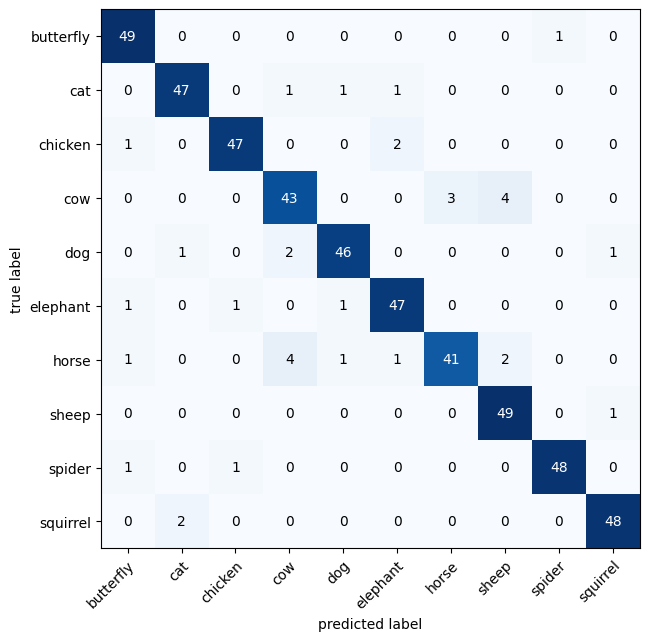

In [35]:
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix


# Apply the function to create the predictions
y_pred_tensor , y_target_tensor = prediction.make_predictions(model = best_model, test_dataloader = valid_dataloader)

# 2. Setup confusion matrix instance and compare predictions to targets
# Ensure tensors are on the same device
y_pred_tensor = y_pred_tensor.to(device)
y_target_tensor = y_target_tensor.to(device)

# Setup Confusion Matrix on the same device
confmat = ConfusionMatrix(num_classes=len(class_names), task='multiclass').to(device)

# Compute Confusion Matrix
confmat_tensor = confmat(preds=y_pred_tensor, target=y_target_tensor)


# 3. Plot the confusion matrix
fig, ax = plot_confusion_matrix(
    conf_mat=confmat_tensor.cpu().numpy(),  # matplotlib likes working with NumPy
    class_names=class_names,          # turn the row and column labels into class names
    figsize=(10, 7)
)

In [37]:
predictions = []
for idx, (images, labels) in enumerate(valid_dataloader):
    outputs = model(images.to(device))
    preds = outputs.argmax(dim=1).cpu()
    for i, (true_label, pred_label) in enumerate(zip(labels, preds)):
        predictions.append((idx * 32 + i, true_label.item(), pred_label.item()))


In [42]:
cat_misclassified = [i for i, t, p in predictions if t == 1 and p != 1]
print("Indices of misclassified cat images:", cat_misclassified)


Indices of misclassified cat images: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 94, 95, 96, 97, 98, 99]


In [ ]:
prediction.classification_report(y_true = y_pred_tensor ,y_pred= y_target_tensor)

In [25]:
def accuracy_fn(y_true, y_pred):
    """Calculates accuracy between truth labels and predictions.

    Args:
        y_true (torch.Tensor): Truth labels for predictions.
        y_pred (torch.Tensor): Predictions to be compared to predictions.

    Returns:
        [torch.float]: Accuracy value between y_true and y_pred, e.g. 78.45
    """
    correct = torch.eq(y_true, y_pred).sum().item()
    acc = (correct / len(y_pred)) * 100
    return acc

accuracy_fn(y_true = y_target_tensor, y_pred = y_pred_tensor)

93.0

In [26]:
from PIL import Image

def pred_and_plot_image(
    model: torch.nn.Module,
    class_names: List[str],
    image_path: str,
    image_size: Tuple[int, int] = (224, 224),
    transform: torchvision.transforms = None,
    device: torch.device = device,
):
    """Predicts on a target image with a target model.

    Args:
        model (torch.nn.Module): A trained (or untrained) PyTorch model to predict on an image.
        class_names (List[str]): A list of target classes to map predictions to.
        image_path (str): Filepath to target image to predict on.
        image_size (Tuple[int, int], optional): Size to transform target image to. Defaults to (224, 224).
        transform (torchvision.transforms, optional): Transform to perform on image. Defaults to None which uses ImageNet normalization.
        device (torch.device, optional): Target device to perform prediction on. Defaults to device.
    """

    # Open image
    img = Image.open(image_path)

    # Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose(
            [
                transforms.Resize(image_size),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )

    ### Predict on image ###

    # Make sure the model is on the target device
    model.to(device)

    # Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
        # Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
        transformed_image = image_transform(img).unsqueeze(dim=0)

        # Make a prediction on image with an extra dimension and send it to the target device
        target_image_pred = model(transformed_image.to(device))

    # Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    # Plot image with predicted label and probability
    plt.figure()
    plt.imshow(img)
    plt.title(
        f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}"
    )
    plt.axis(False)

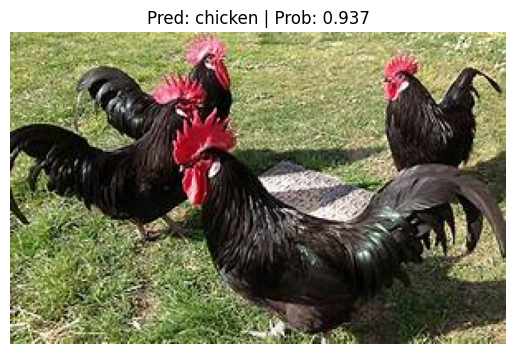

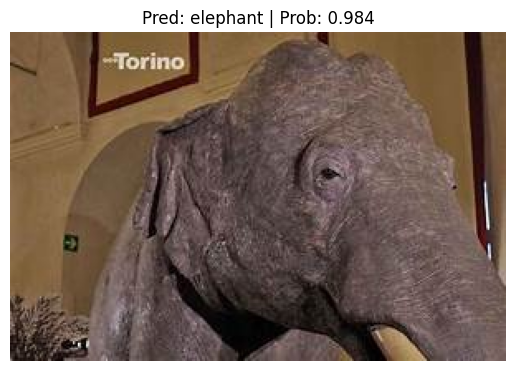

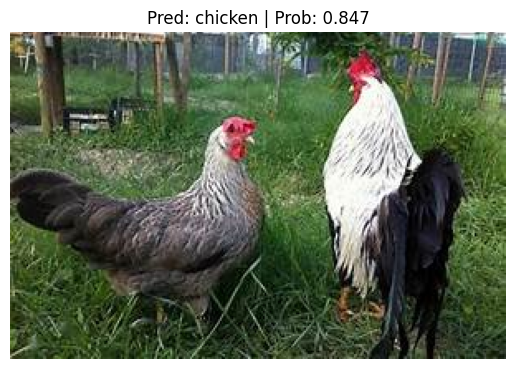

In [27]:
# Get a random list of 3 images from 20% test set
import random
num_images_to_plot = 3
test_image_path_list = list(Path(valid_data).glob("*/*.*")) # get all test image paths from 20% dataset
test_image_path_sample = random.sample(population=test_image_path_list,
                                       k=num_images_to_plot) # randomly select k number of images

# Iterate through random test image paths, make predictions on them and plot them
for image_path in test_image_path_sample:
    pred_and_plot_image(model=best_model,
                        image_path=image_path,
                        class_names=class_names,
                        image_size=(224, 224))

### 7. Predict on real life images
One of the major problems in Machine Learning is the accuracy of the model in real life scenarios.
Many machine learning models have great training, testing and validation accuracy but failed in real life scenarios.

In this section we will load some images and premake predictions

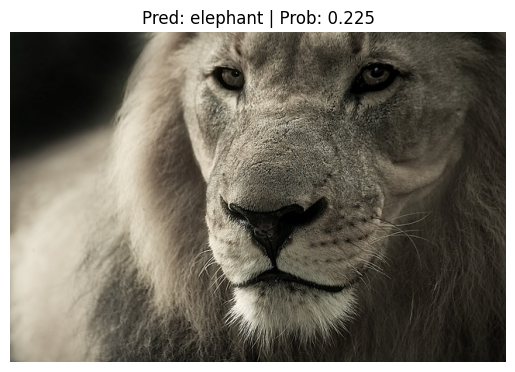

In [45]:
custom_image = Path('/content/drive/MyDrive/my_projects/animal_classification/data_preprocessing_folder/transformed_dataset_50_images/valid/cat/ec3db90e2cf01c22d2524518b7444f92e37fe5d404b0144390f8c079a2efb1_640.jpg')
pred_and_plot_image(model = best_model,
                    image_path = custom_image,
                    class_names = class_names,
                    image_size = (224, 224))


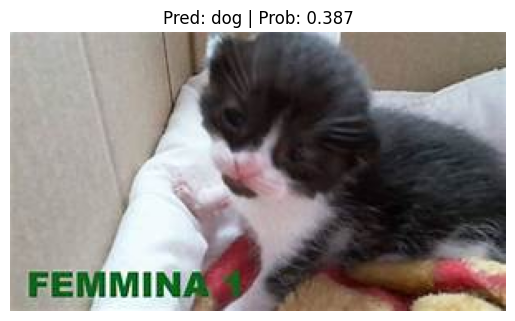

In [46]:
custom_image = Path('/content/drive/MyDrive/my_projects/animal_classification/data_preprocessing_folder/transformed_dataset_50_images/valid/cat/773.jpeg')
pred_and_plot_image(model = best_model,
                    image_path = custom_image,
                    class_names = class_names,
                    image_size = (224, 224))
